In [2]:
# === Check PyTorch and CUDA Configuration ===

import torch  # Import PyTorch

# Print the installed PyTorch version
print("PyTorch version:", torch.__version__)

# Check if CUDA (GPU acceleration) is available
print("CUDA available:", torch.cuda.is_available())

# If a CUDA-capable GPU is available, print its name
if torch.cuda.is_available():
    print("Device:", torch.cuda.get_device_name(0))


PyTorch version: 2.2.1+cu121
CUDA available: True
Device: NVIDIA GeForce GTX 1060 6GB


Run this in the terminal, if there is no Data folder under CLIP/Anomaly
    python AnomalyCLIP\generate_dataset_json\costum_circuiteboard.py

Run this in the terminal if there is need to train the model

python AnomalyCLIP\train.py `
  --train_data_path CLIP\Anomaly\Data `
  --save_path CLIP\Anomaly\checkpoints `
  --dataset circuitboard `
  --depth 9 `
  --n_ctx 12 `
  --t_n_ctx 4 `
  --feature_map_layer 0 1 2 3 `
  --features_list 6 12 18 24 `
  --epoch 15 `
  --batch_size 8 `
  --image_size 518 `
  --print_freq 1 `
  --save_freq 5 `
  --seed 111


Run this to get results data

python AnomalyCLIP\test.py `
  --data_path CLIP\Anomaly\Data `
  --save_path CLIP\Anomaly\results `
  --checkpoint_path CLIP/Anomaly/checkpoints/epoch_15.pth `
  --dataset circuitboard `
  --features_list 24 `
  --image_size 518 `
  --n_ctx 12 `
  --t_n_ctx 4 `
  --feature_map_layer 0 1 2 3 `
  --metrics image-pixel-level `
  --sigma 4

Bellow is only visualization on the results data

In [5]:
# === Standard Imports ===
import os                        # For working with file paths and directories
import matplotlib.pyplot as plt # For plotting and displaying images
from PIL import Image           # For opening image files


def show_images_from_folders(root_dir, subfolders=['good', 'broken'], num_images=6):
    """
    Displays a few sample images from specified subfolders inside a root directory.

    Args:
        root_dir (str): Path to the main dataset folder.
        subfolders (list): List of subfolder names to look into (e.g., ['good', 'bad']).
        num_images (int): Maximum number of images to show in total.
    """
    image_paths = []  # To collect all eligible image paths

    # === Step 1: Collect image file paths from subfolders ===
    for subfolder in subfolders:
        folder_path = os.path.join(root_dir, subfolder)  # e.g., root_dir/good or root_dir/bad

        # List all image files in the subfolder with allowed extensions
        files = [
            os.path.join(folder_path, f)
            for f in os.listdir(folder_path)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ]

        # Add these paths to the list
        image_paths.extend(files)

    # === Step 2: Limit the number of images shown ===
    image_paths = image_paths[:num_images]

    # === Step 3: Display the selected images ===
    plt.figure(figsize=(15, 5))  # Create a wide figure

    for i, img_path in enumerate(image_paths):
        img = Image.open(img_path)  # Load image
        plt.subplot(1, num_images, i + 1)  # One row, num_images columns
        plt.imshow(img)                   # Show image
        plt.axis('off')                   # Hide axis ticks
        plt.title(os.path.basename(os.path.dirname(img_path)))  # Use folder name as title

    plt.tight_layout()  # Prevent overlap of titles and images
    plt.show()


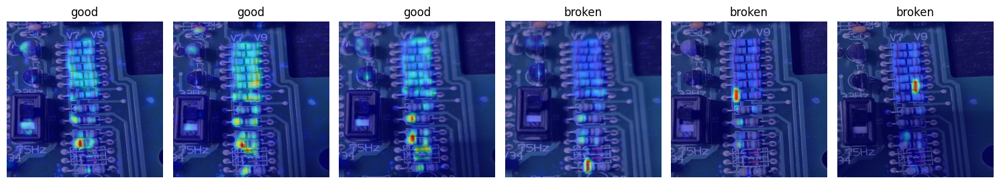

In [6]:
# === Define the Root Directory for Sample Images ===

root_dir = 'results/imgs/circuitboard'  # Path to the dataset or prediction result images

# === Display a Sample of Images from 'good' and 'bad' Subfolders ===

# This will show up to 6 images total, pulled from the 'good/' and 'bad/' subfolders
# under the specified root directory. It’s useful to quickly verify content visually.

show_images_from_folders(root_dir, num_images=6)


In [8]:
import os
from PIL import Image
import matplotlib.pyplot as plt

def show_original_and_result_images_by_category(
    result_root_dir,
    original_data_path,
    category='good',
    num_images=6
):
    """
    Displays side-by-side original and result images from a specific category.
    """
    # Construct full paths
    result_folder = os.path.join(result_root_dir, category)
    original_folder = os.path.join(original_data_path, category)

    # Validate folders
    if not os.path.exists(result_folder):
        print(f"❌ Result folder does not exist: {result_folder}")
        return
    if not os.path.exists(original_folder):
        print(f"❌ Original folder does not exist: {original_folder}")
        return

    # Collect valid image files
    files = [
        f for f in os.listdir(result_folder)
        if f.lower().endswith(('.png', '.jpg', '.jpeg'))
    ]

    if not files:
        print(f"❌ No images found in {result_folder}")
        return

    # Limit number of images shown
    files = files[:num_images]

    # Collect pairs of original and result image paths
    image_pairs = []
    for f in files:
        result_img_path = os.path.join(result_folder, f)
        original_img_path = os.path.join(original_folder, f)

        if not os.path.exists(original_img_path):
            print(f"⚠️ Original image not found for: {f}")
            continue

        image_pairs.append((original_img_path, result_img_path))

    if not image_pairs:
        print("❌ No valid image pairs found.")
        return

    # === Plotting ===
    num_pairs = len(image_pairs)
    fig, axes = plt.subplots(num_pairs, 2, figsize=(8, 4 * num_pairs))

    if num_pairs == 1:
        axes = [axes]  # ensure consistent indexing

    for i, (orig_path, result_path) in enumerate(image_pairs):
        orig_img = Image.open(orig_path)
        result_img = Image.open(result_path)

        # Original
        axes[i][0].imshow(orig_img)
        axes[i][0].set_title(f"Original - {category}")
        axes[i][0].axis('off')

        # Result
        axes[i][1].imshow(result_img)
        axes[i][1].set_title("Model Output")
        axes[i][1].axis('off')

    plt.tight_layout()
    plt.show()


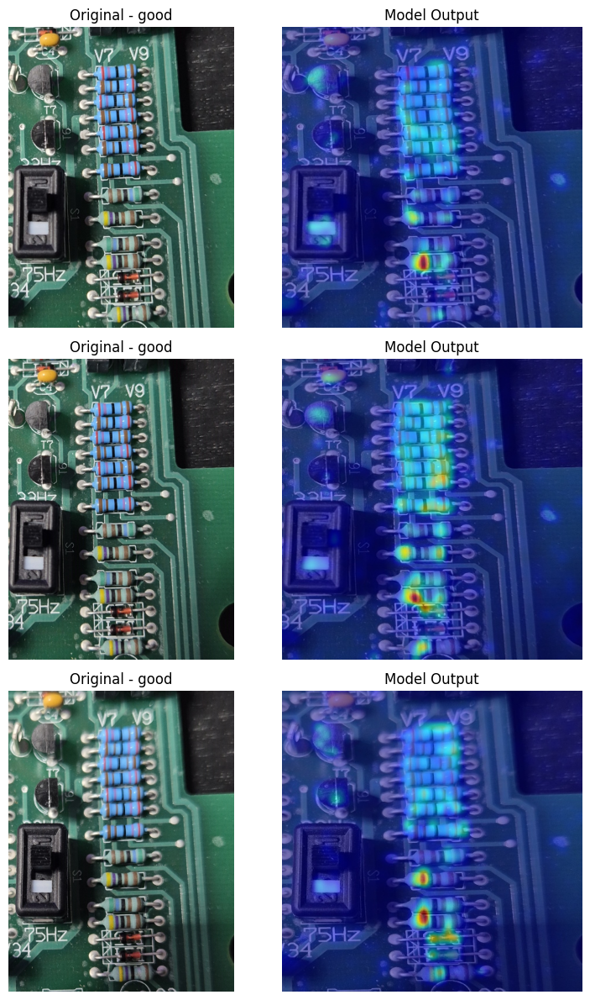

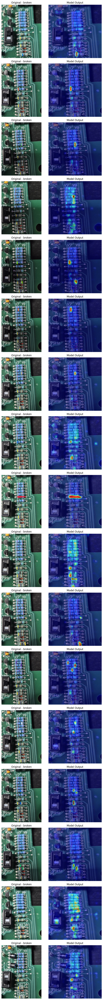

In [11]:
# === Define Paths ===
from pathlib import Path

# Define relative paths based on current notebook location
results_root_dir = Path("results/imgs/circuitboard")        # relative to CLIP_Anomaly.ipynb
original_data_path = Path("Data/circuitboard/test")         # relative to CLIP_Anomaly.ipynb

# Convert to absolute paths for robustness
results_root_dir = results_root_dir.resolve()
original_data_path = original_data_path.resolve()

# === Visualize Good Image Results ===

# Call visualization function for 'good'
show_original_and_result_images_by_category(
    result_root_dir=results_root_dir,
    original_data_path=original_data_path,
    category='good',
    num_images=3
)

# Call for 'broken'
show_original_and_result_images_by_category(
    result_root_dir=results_root_dir,
    original_data_path=original_data_path,
    category='broken',
    num_images=20
)